# UNet Inference

### Necessary Imports

In [12]:
import argparse
import time
from collections import defaultdict
from pathlib import Path
import h5py
import numpy as np
import requests
import torch
from tqdm import tqdm
from matplotlib import pyplot as plt
from typing import Tuple
import fastmri
import fastmri.data.transforms as T
from fastmri.data import SliceDataset
from fastmri.models import Unet
from fastmri.pl_modules import FastMriDataModule, UnetModule
from fastmri.data.subsample import create_mask_for_mask_type

### Reconstruction Helper Functions

In [13]:
def complex_center_crop(data: torch.Tensor, shape: Tuple[int, int]) -> torch.Tensor:
    if not (0 < shape[0] <= data.shape[-3] and 0 < shape[1] <= data.shape[-2]):
        raise ValueError("Invalid shapes.")
    w_from = (data.shape[-3] - shape[0]) // 2
    h_from = (data.shape[-2] - shape[1]) // 2
    w_to = w_from + shape[0]
    h_to = h_from + shape[1]
    return data[..., w_from:w_to, h_from:h_to, :]

def generate_chirp(n):
    delt_C= 0.5
    phi=1j*np.zeros([n,n])
    for i in range(n):
        phi[i,i]=np.exp(-1j*(delt_C*((i+1)**2)+delt_C))        
    FFTMTX = (1/np.sqrt(n))*np.fft.fftshift(np.fft.fft(np.fft.ifftshift(np.eye(n))))
    encoder= np.asmatrix(FFTMTX)*np.asmatrix(phi)
    return encoder

def run_unet_model(batch, model, device):
    image, _, mean, std, fname, slice_num, _ = batch
    output = model(image.to(device).unsqueeze(1)).squeeze(1).cpu()
    mean = mean.unsqueeze(1).unsqueeze(2)
    std = std.unsqueeze(1).unsqueeze(2)
    output = (output * std + mean).cpu()
    return output, int(slice_num[0]), fname[0]

def rename_keys(data_dict):
    my_dict = data_dict.copy()
    for key in data_dict.keys():
        split = key.split('.')
        sliced = split[1:]  
        join = '.'.join(sliced)
        my_dict[join] = my_dict.pop(key)       
    return my_dict


def run_inference_fourier(ckpt_file, data_path, output_path, device):
    model = Unet(in_chans=1, out_chans=1, chans=32, num_pool_layers=4, drop_prob=0.0)
    checkpoint = torch.load(ckpt_file)
    state_dict = rename_keys(checkpoint['state_dict'])
    model.load_state_dict(state_dict)
    model = model.eval()
    mask = create_mask_for_mask_type("random", [0.08], [4])
    data_transform = T.UnetDataTransform(which_challenge="singlecoil", mask_func=mask)
    dataset = SliceDataset(
            root=data_path,
            transform=data_transform,
            challenge="singlecoil",
        )
    dataloader = torch.utils.data.DataLoader(dataset, num_workers=4)
    start_time = time.perf_counter()
    outputs = defaultdict(list)
    model = model.to(device)
    for batch in tqdm(dataloader, desc="Running inference"):
        with torch.no_grad():
            output, slice_num, fname = run_unet_model(batch, model, device)

        outputs[fname].append((slice_num, output))
    for fname in outputs:
        outputs[fname] = np.stack([out for _, out in sorted(outputs[fname])])
    fastmri.save_reconstructions(outputs, Path(output_path) / "reconstructions")
    end_time = time.perf_counter()
    print(f"Elapsed time for {len(dataloader)} slices: {end_time-start_time}")

def run_inference_chirp(ckpt_file, data_path, output_path, device):
    model = Unet(in_chans=1, out_chans=1, chans=32, num_pool_layers=4, drop_prob=0.0)
    checkpoint = torch.load(ckpt_file)
    state_dict = rename_keys(checkpoint['state_dict'])
    model.load_state_dict(state_dict)
    model = model.eval()
    chirp_encoder = generate_chirp(320)
    fourier_encoder = np.asmatrix((1/np.sqrt(320))*np.fft.fftshift(np.fft.fft(np.fft.ifftshift(np.eye(320)))))
    data_transform = T.UnetDataTransformChirp(chirp_encoder=chirp_encoder, fourier_encoder=fourier_encoder)
    dataset = SliceDataset(
            root=data_path,
            transform=data_transform,
            challenge="singlecoil",
        )
    dataloader = torch.utils.data.DataLoader(dataset, num_workers=4)
    start_time = time.perf_counter()
    outputs = defaultdict(list)
    model = model.to(device)
    for batch in tqdm(dataloader, desc="Running inference"):
        with torch.no_grad():
            output, slice_num, fname = run_unet_model(batch, model, device)

        outputs[fname].append((slice_num, output))
    for fname in outputs:
        outputs[fname] = np.stack([out for _, out in sorted(outputs[fname])])
    fastmri.save_reconstructions(outputs, Path(output_path) / "reconstructions")
    end_time = time.perf_counter()
    print(f"Elapsed time for {len(dataloader)} slices: {end_time-start_time}")

### Load checkpoints and save reconstructions (Fourier and Chirp)

device : str &rarr; Choose device to run inference. Options : "cpu" , "cuda".  
ckpt_file : str &rarr; Path to saved checkpoint (ckpt file).  
data_path : str &rarr; Path to test dataset.  
output_path: str &rarr; Path to save reconstructions.  

**Note: Skip this step if you have already run this cell for the given dataset**

In [11]:
device ="cuda"
ckpt_file = "epoch=41-step=1459164.ckpt"
data_path = "Data/singlecoil_test"
output_path = "Results_Fourier"

run_inference_fourier(
    ckpt_file,
    data_path,
    output_path,
    torch.device(device)
)


ckpt_file = "epoch=46-step=1632874.ckpt"
output_path = "Results_Chirp"

run_inference_fourier(
    ckpt_file,
    data_path,
    output_path,
    torch.device(device)
)

Running inference: 100%|██████████████████████| 227/227 [00:02<00:00, 92.97it/s]


Elapsed time for 227 slices: 2.7021838380005647


Running inference: 100%|██████████████████████| 227/227 [00:02<00:00, 98.39it/s]


Elapsed time for 227 slices: 2.5401144299994485


### Visualization Helper Functions

In [29]:
def Preprocessed_Chirp(kspace, chirp_encoder, fourier_encoder):   
    kspace_torch = T.to_tensor(kspace)
    crop_size = (320,320)
    image = fastmri.ifft2c(kspace_torch)
    image = complex_center_crop(image, crop_size)
    image_mat = np.asmatrix(fastmri.tensor_to_complex_np(image),dtype=complex)
    chirp_kspace = chirp_encoder*image_mat*fourier_encoder.H
    random_mask = T.generate_random_mask(320,320,4)
    us_random = np.multiply(random_mask, chirp_kspace)
    us_chirp = np.fliplr(abs(chirp_encoder.H*us_random*fourier_encoder.H))
    us_chirp_tensor = T.to_tensor(np.array(us_chirp))
    image, mean, std = T.normalize_instance(us_chirp_tensor, eps=1e-11)
    image = image.clamp(-6, 6)
    image = image.to(torch.float32)
    return image

def Preprocessed_Fourier(kspace):
    kspace_torch = T.to_tensor(kspace)
    mask = create_mask_for_mask_type("random", [0.08], [4])
    masked_kspace = T.apply_mask(kspace_torch, mask_func=mask)[0]
    image = fastmri.ifft2c(masked_kspace)
    crop_size = (320,320)
    image = complex_center_crop(image, crop_size)
    image = fastmri.complex_abs(image)
    image, mean, std = T.normalize_instance(image, eps=1e-11)
    image = image.clamp(-6, 6)
    return image

def Get_RC_MRI(file_name,slice_num):   
    hf = h5py.File(file_name)
    reconstructed_image = hf['reconstruction']   
    image_slice = reconstructed_image[slice_num][0]
    return image_slice

def Get_Original_MRI(file_name, slice_num):   
    hf = h5py.File(file_name)
    volume_kspace = hf['kspace']  
    slice_kspace = volume_kspace[slice_num]
    chirp_encoder = generate_chirp(320)
    fourier_encoder = np.asmatrix((1/np.sqrt(320))*np.fft.fftshift(np.fft.fft(np.fft.ifftshift(np.eye(320)))))
    chirp_input = Preprocessed_Chirp(slice_kspace, chirp_encoder, fourier_encoder)
    fourier_input = Preprocessed_Fourier(slice_kspace)
    return fourier_input, chirp_input

def Collect_All(file_original, file_name, file_fourier, file_chirp ,slice_num):
    fourier_input, chirp_input = Get_Original_MRI(file_original+file_name, slice_num)
    fourier_output = Get_RC_MRI(file_fourier+file_name, slice_num)
    chirp_output = Get_RC_MRI(file_chirp+file_name, slice_num)
    return fourier_input, chirp_input, fourier_output, chirp_output

def Get_Total_Slice(file_chirp ,file_name):
    hf = h5py.File(file_chirp+file_name)
    reconstructed_image = hf['reconstruction']
    slices = reconstructed_image.shape[0]
    return slices
    
def Visualize_All(fourier_input, chirp_input,fourier_output, chirp_output, slice_num):
    fig = plt.figure(figsize=(8,8), dpi= 100)
    ax1 = fig.add_subplot(221)
    ax2 = fig.add_subplot(222)
    ax3 = fig.add_subplot(223)
    ax4 = fig.add_subplot(224)
    ax1.title.set_text('Fourier Input '+str(slice_num+1))
    ax2.title.set_text('Chirp Input '+str(slice_num+1))
    ax3.title.set_text('Fourier Output '+str(slice_num+1))
    ax4.title.set_text('Chirp Output '+str(slice_num+1))
    ax1.imshow(fourier_input,cmap='gray')
    ax2.imshow(chirp_input,cmap='gray')
    ax3.imshow(fourier_output,cmap='gray')
    ax4.imshow(chirp_output,cmap='gray')
    plt.show()

### Visualizing model input and reconstruction
  
show_all : *bool* &rarr; Display all slices if **True**  
slice_num :*int* &rarr; Number of slice to be displayed if **show_all** is **False**  
file_name : *str* &rarr; Name of h5 file to be loaded.  
file_original : *str* &rarr; Path to fully sampled data.  
file_fourier : *str* &rarr; Path to fourier reconstructions.  
file_chirp : *str* &rarr; Path to chirp reconstructions.   

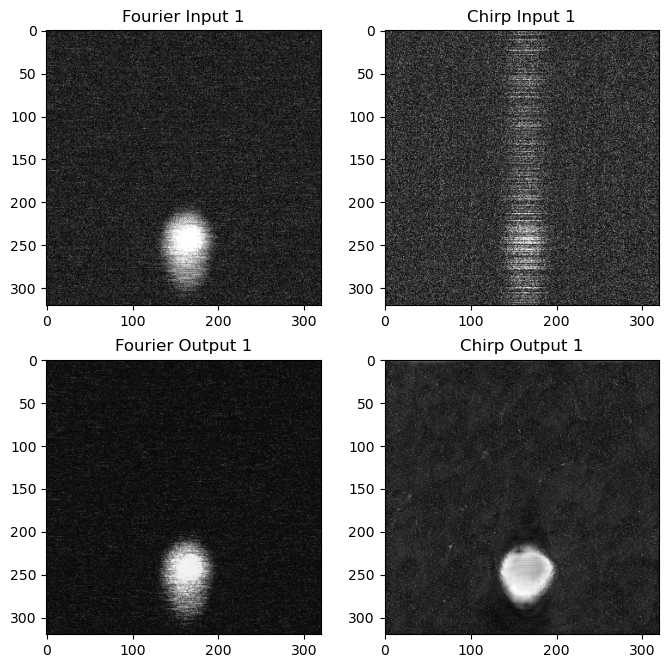

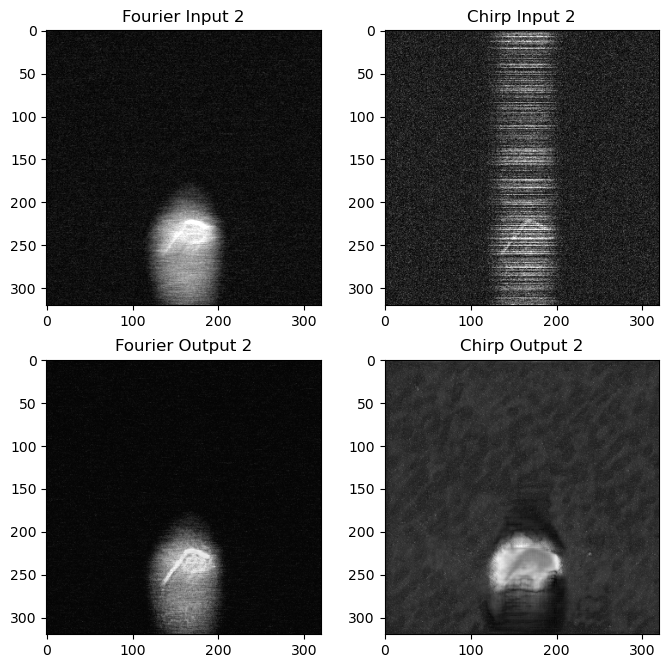

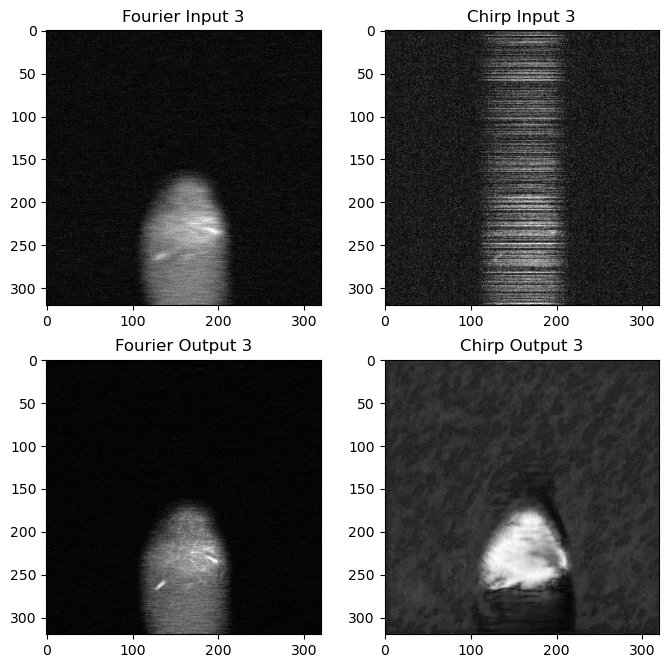

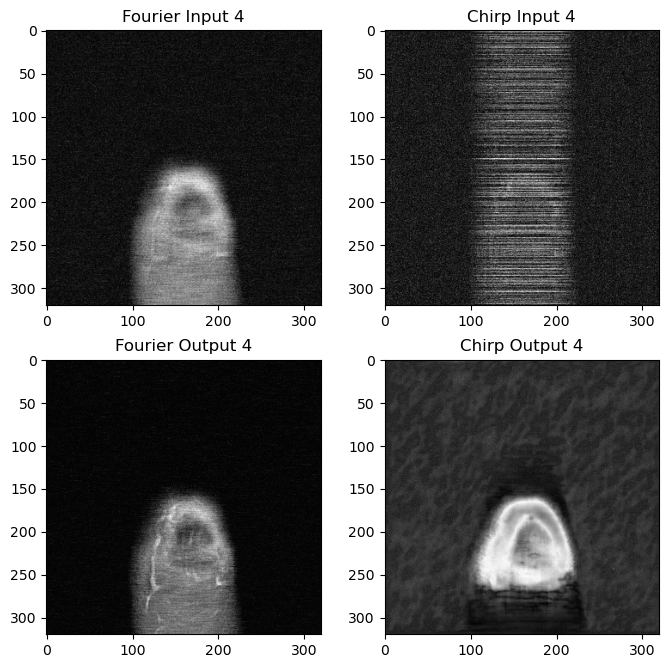

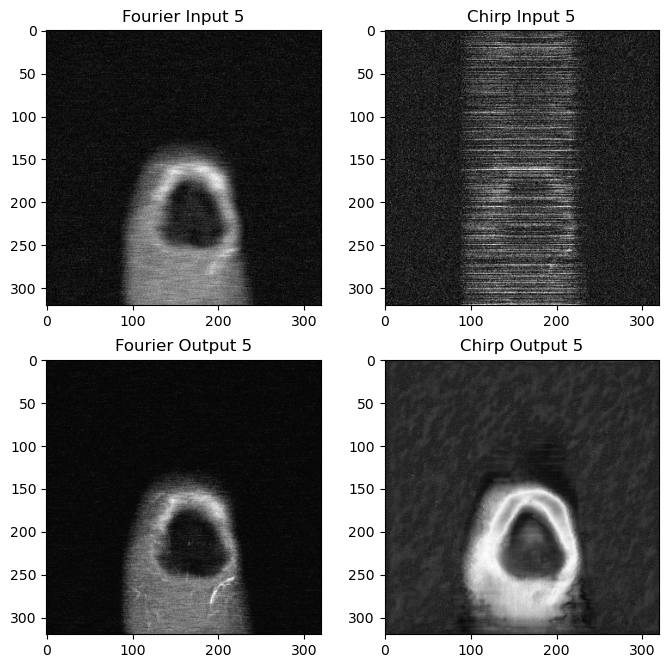

...

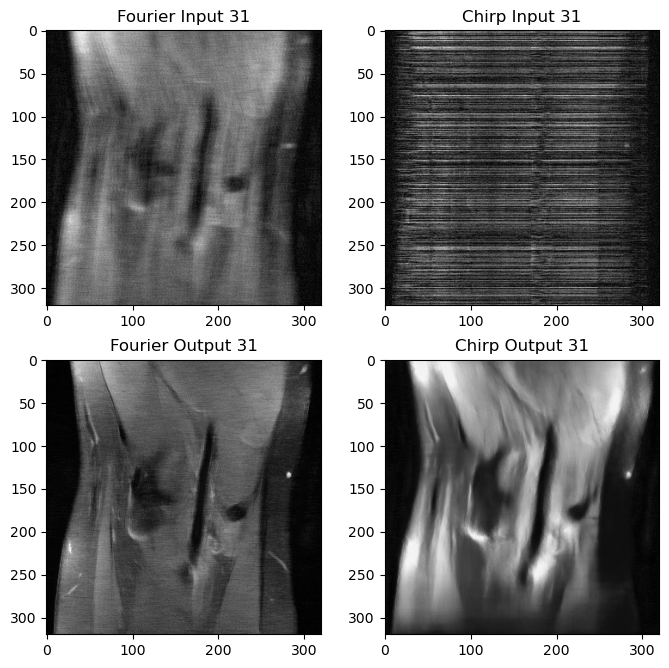

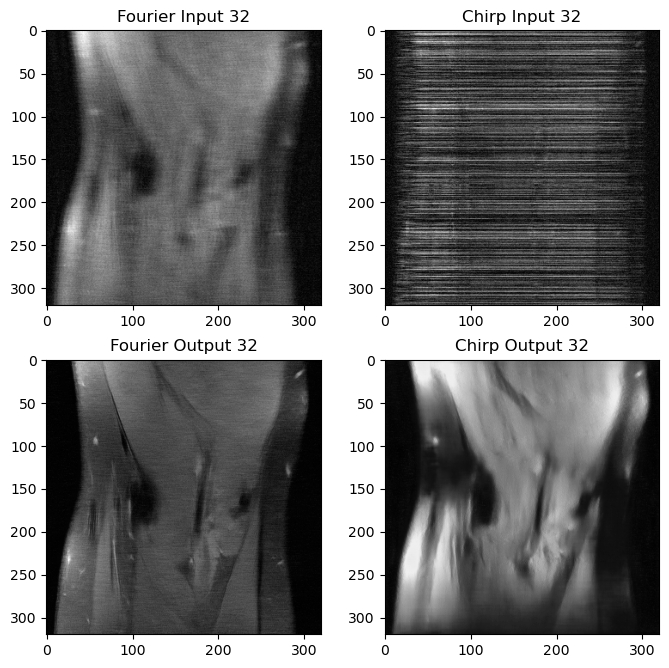

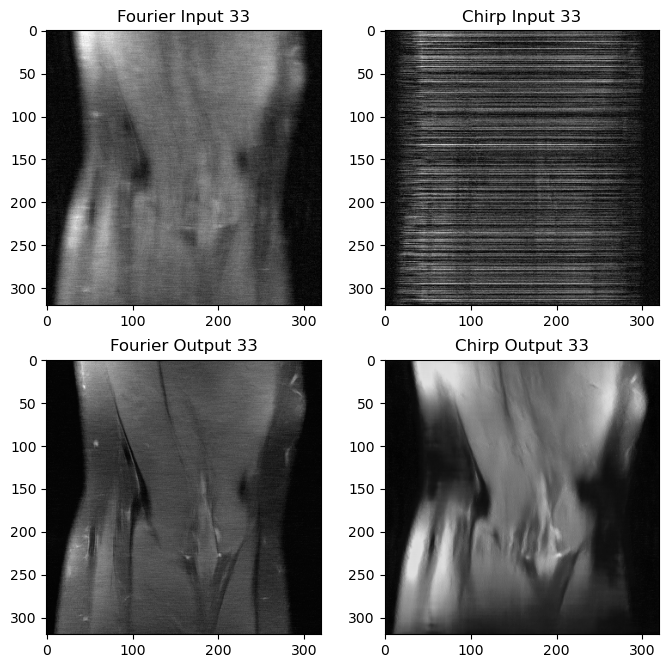

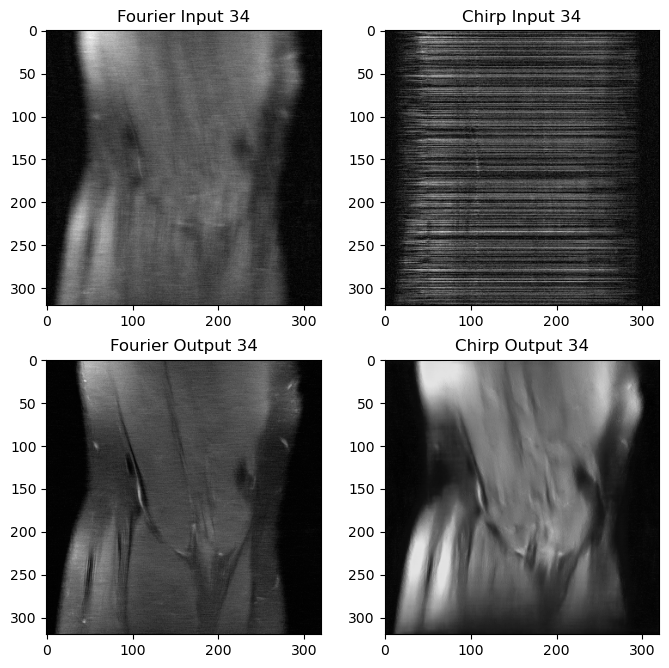

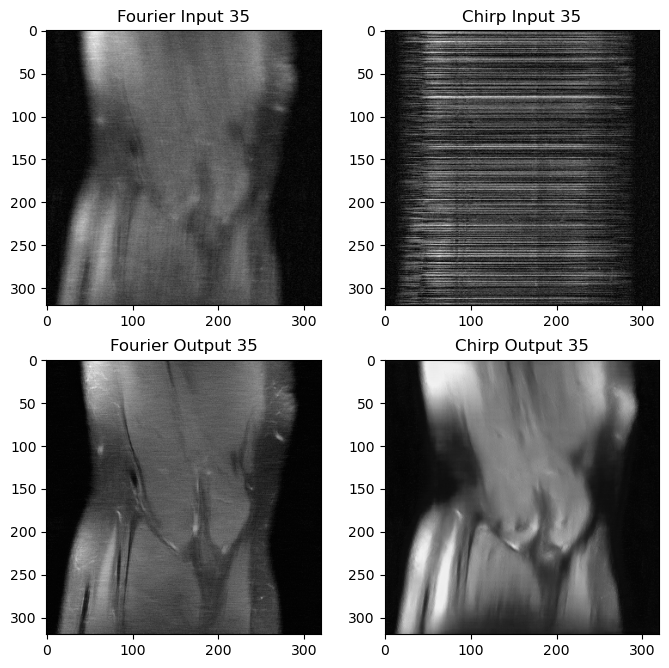

In [30]:
show_all = True
slice_num = 20
file_name = 'file1000000.h5'
file_original = 'Data/singlecoil_test/' 
file_fourier = 'Results_Fourier/reconstructions/'
file_chirp = 'Results_Chirp/reconstructions/'

if show_all:
    slices = Get_Total_Slice(file_chirp,file_name)
    for sliced in range(slices):
        images = Collect_All(file_original,file_name,file_fourier,file_chirp,sliced)
        Visualize_All(images[0],images[1],images[2],images[3],sliced)
else:
    images = Collect_All(file_original,file_name,file_fourier,file_chirp,slice_num)
    Visualize_All(images[0],images[1],images[2],images[3],slice_num-1)